Question 2: By using AWS Sagemaker analyze all scraped images and save results to a csv file
(20 points)

For this task, I used AWS SageMaker Notebook to analyze all the images that I had scraped from Pinterest. I loaded the image URLs from two .csv files and used AWS Rekognition, an image analysis service, to detect objects or labels in each image. For every image, I extracted labels that had a confidence score above 70%. Finally, I saved the results — including image name, detected labels, and their confidence scores — into a new CSV file using Python and Pandas. This helped automate the entire image analysis process using SageMaker.

Processing: https://i.pinimg.com/136x136/1b/da/ca/1bdaca54b40441bc8a1bccc733e3ca43.jpg


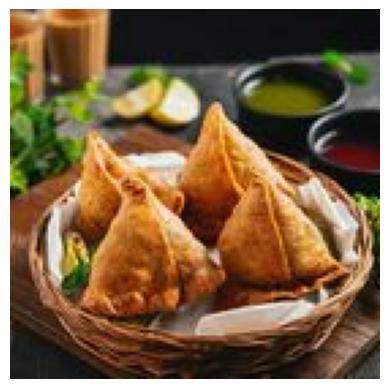

Food : 100.00
Lunch : 100.00
Meal : 100.00
Dish : 97.33
Dessert : 89.46
Pastry : 89.46
Processing: https://i.pinimg.com/136x136/70/42/ce/7042ce5f7d90803c0e61c244f576691e.jpg


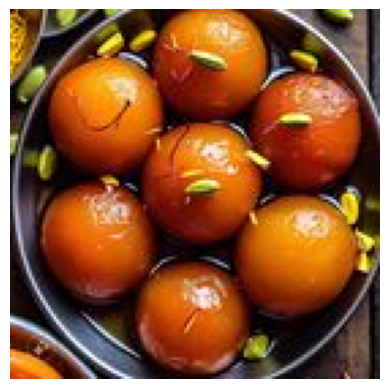

Citrus Fruit : 98.26
Food : 98.26
Fruit : 98.26
Orange : 98.26
Plant : 98.26
Produce : 98.26
Meal : 97.22
Dish : 88.40
Sweets : 76.49
Bowl : 71.49
Processing: https://i.pinimg.com/136x136/1f/52/0d/1f520de931cb7e7f5a8166f41e74fc90.jpg


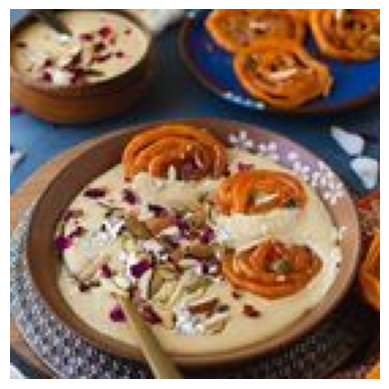

Food : 100.00
Meal : 100.00
Dish : 99.99
Sweets : 96.39
Cream : 94.15
Dessert : 94.15
Icing : 94.15
Processing: https://i.pinimg.com/136x136/42/01/5f/42015fb492f1c36c85bdfe8923f46193.jpg


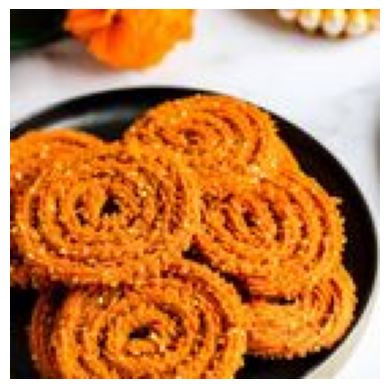

Food : 99.99
Meal : 99.99
Dish : 99.96
Sweets : 99.95
Cream : 96.53
Dessert : 96.53
Icing : 96.53
Pastry : 82.96
Processing: https://i.pinimg.com/136x136/87/11/5c/87115cbaa315422e7c5acc857f9f37e2.jpg


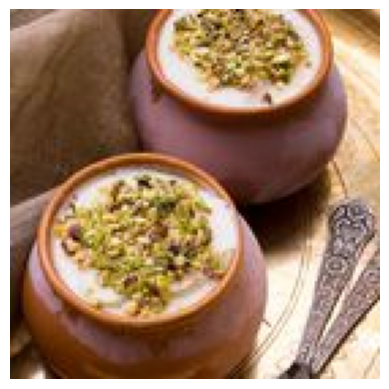

Food : 100.00
Meal : 100.00
Dish : 99.99
Bowl : 97.50
Cup : 91.97
Processing: https://i.pinimg.com/136x136/e5/56/61/e556611ea1a8c04ed7880239fe355d7d.jpg


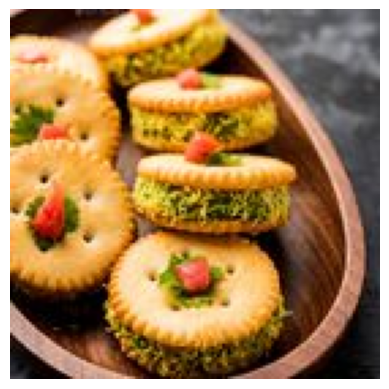

Food : 99.99
Lunch : 99.99
Meal : 99.99
Sweets : 98.78
Bread : 95.97
Cream : 93.96
Dessert : 93.96
Icing : 93.96
Birthday Cake : 91.32
Cake : 91.32
Dish : 82.34
Processing: https://i.pinimg.com/136x136/e2/a1/88/e2a1882761d8366ec611f81c4920ffa2.jpg


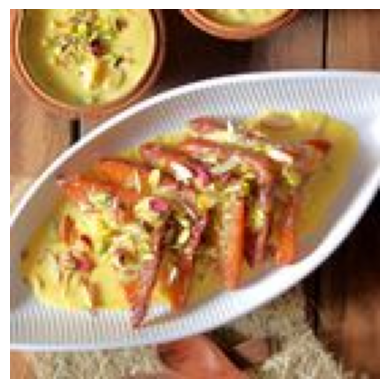

Food : 99.99
Meal : 99.99
Dish : 99.80
Ketchup : 92.55
Done analyzing all images.


In [13]:
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import os
import boto3
import urllib.request as urllib2

# AWS Rekognition client
rekognition = boto3.client('rekognition')

# Output dictionary
output = {"filenames": [], "labels": [], "confidencescores": []}

# Load image URLs from CSV
inputdata = pd.read_csv("TF2_Results.csv", header=0)
imageurllist = list(inputdata["images/136x136/url"])

# Loop through image URLs
for imageurl in imageurllist:
    try:
        print(f"Processing: {imageurl}")
        image_name = os.path.basename(imageurl)

        # Display image (optional)
        response = requests.get(imageurl)
        image = Image.open(BytesIO(response.content))
        plt.imshow(image)
        plt.axis('off')
        plt.show()

        # Download image bytes for Rekognition
        contents = urllib2.urlopen(imageurl).read()
        rekog_response = rekognition.detect_labels(Image={'Bytes': contents})

        labels_list = []
        confidencescores_list = []

        # Filter high-confidence labels
        for label in rekog_response['Labels']:
            if label['Confidence'] > 70.00:
                print(f"{label['Name']} : {label['Confidence']:.2f}")
                labels_list.append(label['Name'])
                confidencescores_list.append(label['Confidence'])

        # Save results — even if no high-confidence label is found
        if not labels_list:
            output["filenames"].append(image_name)
            output["labels"].append(["No labels found"])
            output["confidencescores"].append(["0"])
        else:
            output["filenames"].append(image_name)
            output["labels"].append(labels_list)
            output["confidencescores"].append(confidencescores_list)

    except Exception as e:
        print(f"Error processing {imageurl}: {e}")

# Save to CSV
results_df = pd.DataFrame.from_dict(output)
results_df.to_csv("TF2_RekognitionResults.csv", index=False)

print("Done analyzing all images.")

Processing: https://i.pinimg.com/736x/58/36/a7/5836a78df1991f20db5f78c68ada42bc.jpg


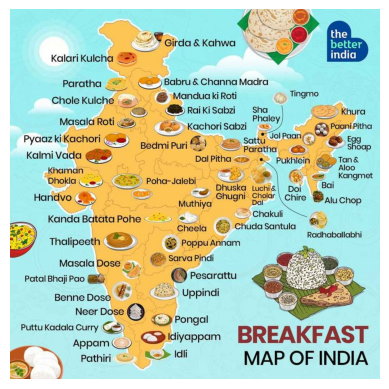

Chart : 99.93
Plot : 99.93
Map : 95.75
Menu : 81.50
Text : 81.50
Atlas : 80.95
Diagram : 80.95
Processing: https://i.pinimg.com/736x/18/05/d9/1805d9109ca91be0dbd4ee639ff6ae73.jpg


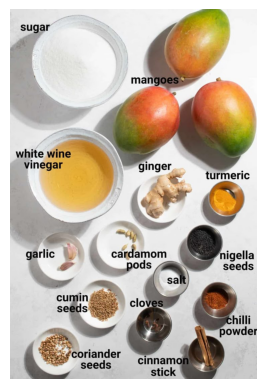

Food : 99.03
Fruit : 99.03
Plant : 99.03
Produce : 99.03
Pear : 96.29
Mango : 86.64
Processing: https://i.pinimg.com/736x/54/b3/5f/54b35fe88fa63e4c356b91cedb102ffb.jpg


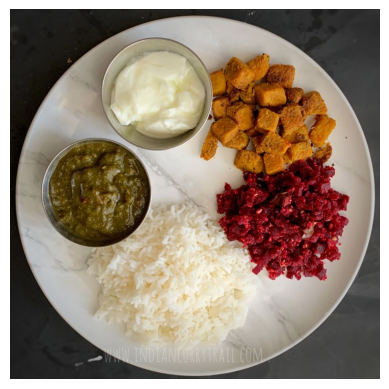

Food : 100.00
Food Presentation : 100.00
Plate : 99.30
Processing: https://i.pinimg.com/736x/99/05/25/9905259d7347c90839ef5ffccdcd7cb4.jpg


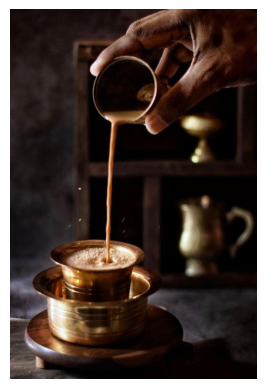

Cooking : 99.96
Food : 99.96
Pouring Food : 99.96
Adult : 82.31
Male : 82.31
Man : 82.31
Person : 82.31
Processing: https://i.pinimg.com/236x/0c/52/43/0c5243ff010e796a0e70731668947bcc.jpg


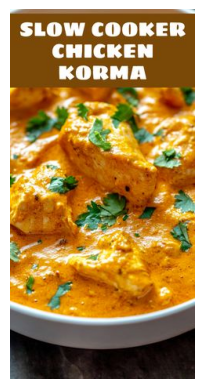

Curry : 100.00
Food : 100.00
Ketchup : 71.31
Processing: https://i.pinimg.com/736x/2b/d2/48/2bd2488b923e3eb792f8585b7f05f167.jpg


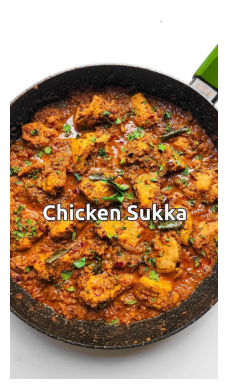

Curry : 99.99
Food : 99.99
Meat : 99.59
Pork : 99.59
Mutton : 92.11
Processing: https://i.pinimg.com/236x/1e/cc/6c/1ecc6c15d4a21ddafa548b1d65d02a62.jpg


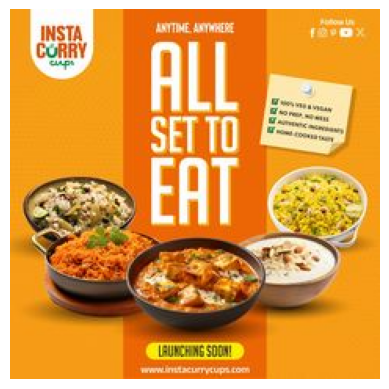

Advertisement : 100.00
Poster : 100.00
Food : 99.89
Lunch : 99.89
Meal : 99.89
Processing: https://i.pinimg.com/736x/a1/a7/f9/a1a7f9b82d3c4e28d181cbf048722d08.jpg


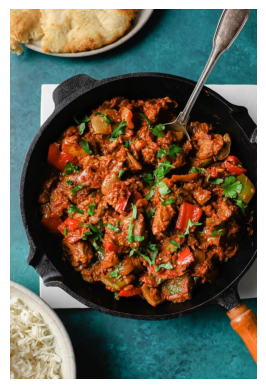

Food : 99.43
Food Presentation : 99.43
Cookware : 97.94
Meat : 95.37
Mutton : 95.37
Processing: https://i.pinimg.com/736x/8c/27/43/8c27439c5e24dee6ff09a42918d1cd5b.jpg


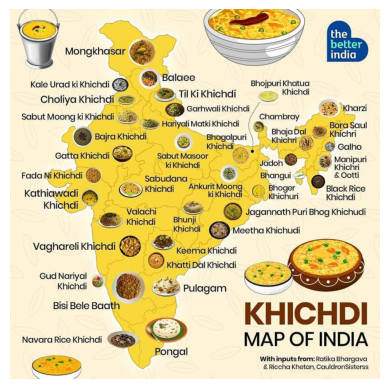

Advertisement : 97.60
Menu : 96.95
Text : 96.95
Processing: https://i.pinimg.com/736x/1a/59/f0/1a59f0e988c227075ce7a6e261f9f362.jpg


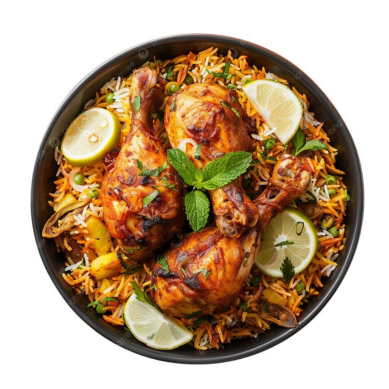

Food : 100.00
Food Presentation : 100.00
Meat : 97.88
Pork : 97.88
Processing: https://i.pinimg.com/736x/07/ef/dd/07efdd9ff704d64feb12ddd2ef84292d.jpg


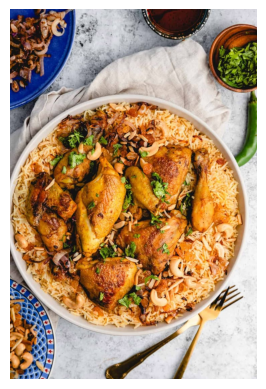

Food : 100.00
Food Presentation : 100.00
Meat : 99.28
Pork : 99.28
Processing: https://i.pinimg.com/236x/93/8a/82/938a8246e3f4b07653a5127ebab820c3.jpg


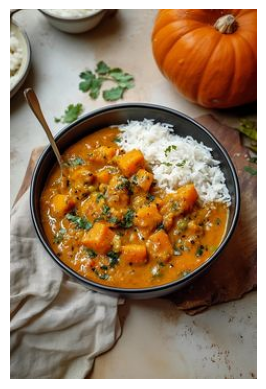

Curry : 100.00
Food : 100.00
Meal : 100.00
Dish : 100.00
Stew : 99.89
Lunch : 97.62
Bowl : 97.14
Produce : 83.34
Processing: https://i.pinimg.com/736x/06/da/c5/06dac5f1d1bae9f8820cc46de034ce75.jpg


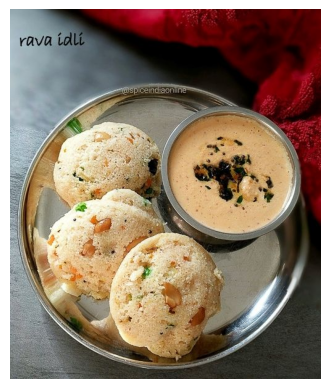

Food : 100.00
Food Presentation : 100.00
Meal : 99.19
Bread : 99.03
Plate : 94.89
Dish : 82.22
Processing: https://i.pinimg.com/736x/93/7b/f8/937bf8b7c33ad92aa373f320319d2d50.jpg


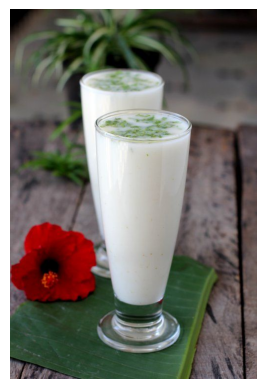

Beverage : 99.86
Juice : 99.86
Smoothie : 99.52
Milk : 93.32
Flower : 84.69
Plant : 84.69
Processing: https://i.pinimg.com/736x/99/59/50/995950709eca13c8edf19386653309d6.jpg


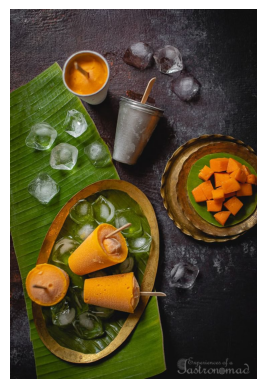

Food : 100.00
Food Presentation : 100.00
Plate : 97.34
Processing: https://i.pinimg.com/736x/e8/08/bd/e808bdc3dbc050cfd071137aad359422.jpg


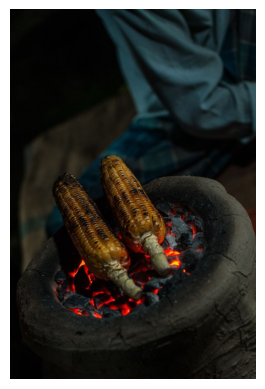

Person : 94.96
Food : 83.81
Food Presentation : 79.13
Cookware : 75.74
Pot : 75.74
Processing: https://i.pinimg.com/736x/09/91/54/09915474e4f8ce31ae42979244fb3cfa.jpg


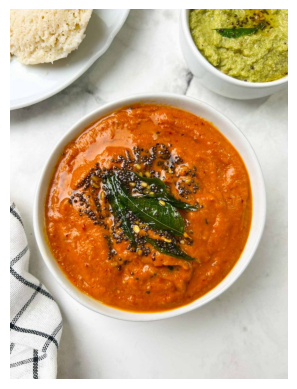

Food : 100.00
Food Presentation : 100.00
Bowl : 94.72
Soup Bowl : 94.72
Plate : 87.29
Processing: https://i.pinimg.com/736x/d9/43/d3/d943d37eda6fb228a806b420d8336fdb.jpg


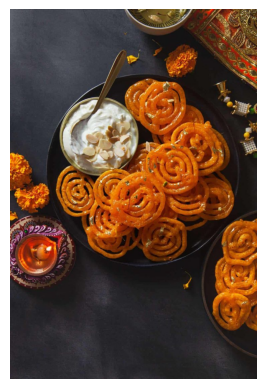

Food : 100.00
Food Presentation : 100.00
Brunch : 99.17
Plate : 88.97
Processing: https://i.pinimg.com/736x/63/fe/39/63fe3979c5fa2b9cbe2fffb3784e70cd.jpg


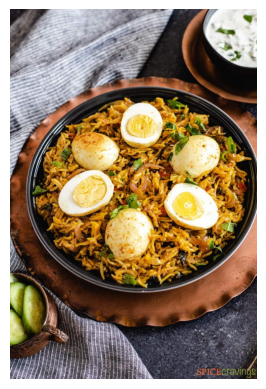

Food : 100.00
Food Presentation : 100.00
Meal : 99.87
Dish : 99.07
Egg : 98.95
Plate : 95.49
Processing: https://i.pinimg.com/736x/9e/91/bd/9e91bd848b5c64a6bbbf905b4c373272.jpg


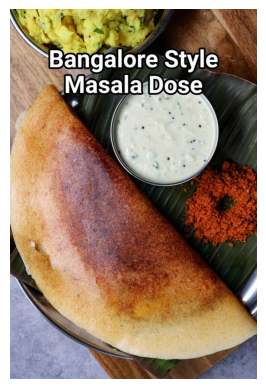

Bread : 99.14
Food : 99.14
Processing: https://i.pinimg.com/736x/f1/ab/1d/f1ab1db85db4b0d3d60dc385daf50fb9.jpg


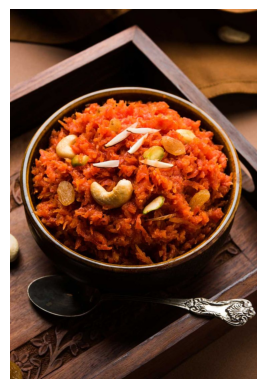

Food : 100.00
Food Presentation : 100.00
Cutlery : 96.21
Spoon : 96.21
Cooking Pot : 84.38
Cookware : 84.38
Pot : 84.38
Processing: https://i.pinimg.com/736x/17/de/6d/17de6db56cfccc647a016d89591a66d3.jpg


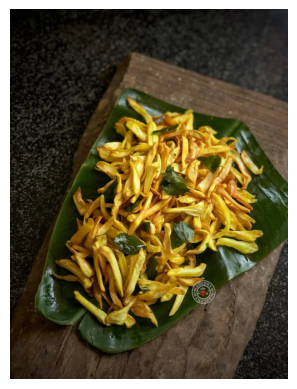

Food : 100.00
Food Presentation : 100.00
Plate : 91.94
Processing: https://i.pinimg.com/736x/50/2d/ae/502daebd739581f0815a269d69487ffe.jpg


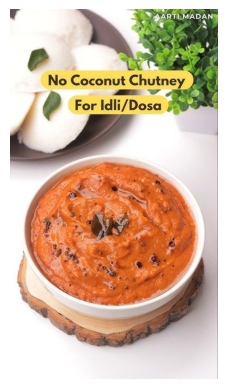

Food : 99.72
Meal : 99.72
Food Presentation : 99.07
Dish : 97.24
Dip : 73.86
Processing: https://i.pinimg.com/736x/1f/be/b5/1fbeb5fb6c65ee7442b1334f875f42f4.jpg


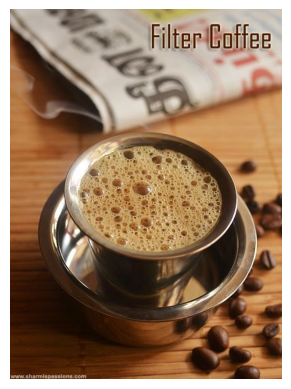

Cup : 99.77
Beverage : 97.98
Coffee : 97.98
Coffee Cup : 97.98
Dynamite : 70.14
Weapon : 70.14
Processing: https://i.pinimg.com/736x/fa/6e/a1/fa6ea155c121173ee45de97a7bdccc2d.jpg


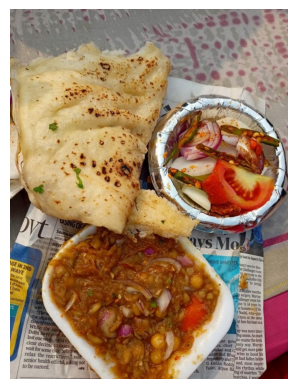

Food : 100.00
Food Presentation : 100.00
Meat : 93.32
Mutton : 93.32
Pizza : 89.84
Bread : 89.34
Processing: https://i.pinimg.com/236x/70/62/b9/7062b91d6dd57fceac65285dd712a32b.jpg


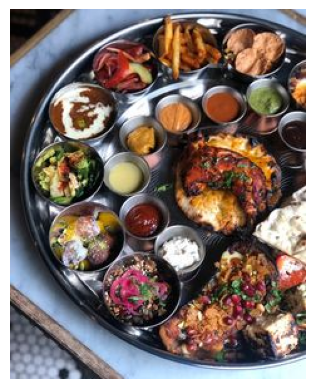

Food : 100.00
Lunch : 100.00
Meal : 100.00
Brunch : 100.00
Dish : 99.98
Platter : 99.98
Dinner : 99.92
Food Presentation : 98.16
Ketchup : 98.02
Meat : 73.08
Pork : 73.08
Processing: https://i.pinimg.com/236x/45/df/35/45df35b21ec9be1d8ea478ea9eec6dd6.jpg


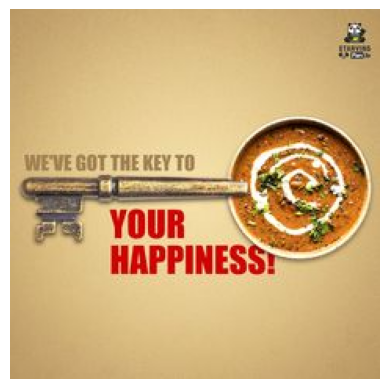

Cutlery : 98.24
Smoke Pipe : 93.86
Spoon : 92.84
Key : 87.74
Processing: https://i.pinimg.com/236x/a8/26/34/a82634efe970982ed0e72ef9d2739aea.jpg


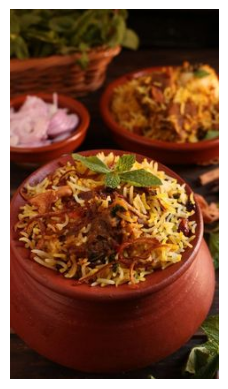

Food : 99.83
Food Presentation : 99.83
Noodle : 99.59
Meal : 98.83
Lunch : 98.11
Pasta : 97.95
Vermicelli : 95.60
Ketchup : 91.31
Dish : 85.49
Processing: https://i.pinimg.com/736x/c5/90/25/c59025a2f536d0fbe02c56342b7507ab.jpg


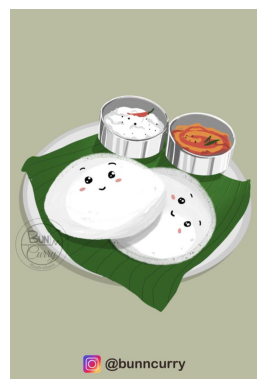

Tape : 95.82
Food : 94.04
Meal : 94.04
Outdoors : 90.82
Nature : 86.51
Winter : 82.70
Snow : 80.21
Processing: https://i.pinimg.com/736x/9f/ac/94/9fac9400f3bde77a4bd2a7bc066d8d9f.jpg


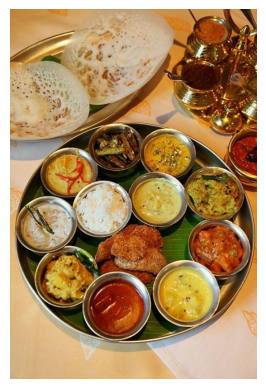

Food : 100.00
Food Presentation : 100.00
Brunch : 99.75
Ketchup : 97.67
Dinner : 85.89
Egg : 72.18
Processing: https://i.pinimg.com/236x/60/2e/be/602ebe5b74d77b808e0779238b2552a4.jpg


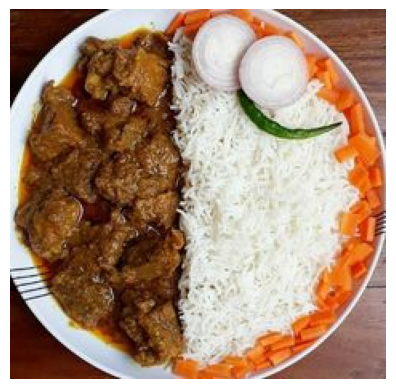

Food : 99.89
Meal : 99.89
Dish : 98.83
Meat : 72.08
Mutton : 72.08
Processing: https://i.pinimg.com/736x/bd/c4/40/bdc4405a2b7d5c6f111275d94bcf4e94.jpg


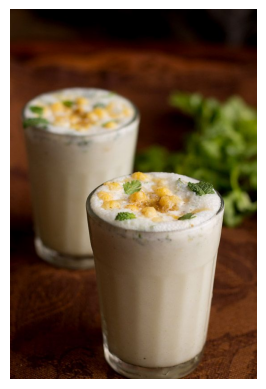

Beverage : 99.64
Juice : 99.64
Smoothie : 99.29
Cup : 98.71
Milk : 97.39
Food : 96.83
Food Presentation : 96.83
Herbs : 87.02
Plant : 87.02
Milkshake : 86.77
Cream : 84.24
Dessert : 84.24
Mousse : 84.24
Disposable Cup : 71.93
Processing: https://i.pinimg.com/736x/2e/09/4b/2e094b19f90148d5c9d33313783f7507.jpg


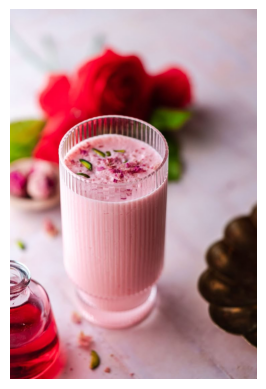

Beverage : 99.76
Juice : 99.76
Cream : 98.97
Dessert : 98.97
Food : 98.97
Mousse : 98.97
Smoothie : 97.55
Milk : 95.65
Milkshake : 75.07
Processing: https://i.pinimg.com/736x/d6/be/99/d6be99b3ffc8033087e466883f7459f1.jpg


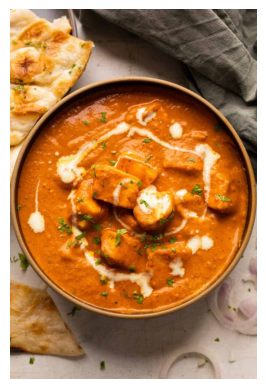

Food : 100.00
Food Presentation : 100.00
Curry : 97.62
Meat : 87.20
Mutton : 87.20
Processing: https://i.pinimg.com/75x75_RS/10/97/ab/1097abb381418a392a4eb763dc63960a.jpg


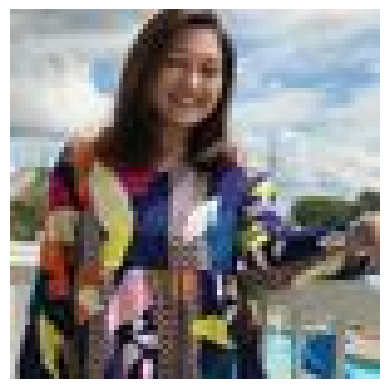

Clothing : 99.67
Vest : 99.67
Lady : 99.38
Person : 99.38
Lifejacket : 96.44
Hippie : 93.50
Face : 84.78
Head : 84.78
Photography : 84.78
Portrait : 84.78
Processing: https://i.pinimg.com/236x/37/1f/1b/371f1b1852278305e8743693bccb0063.jpg


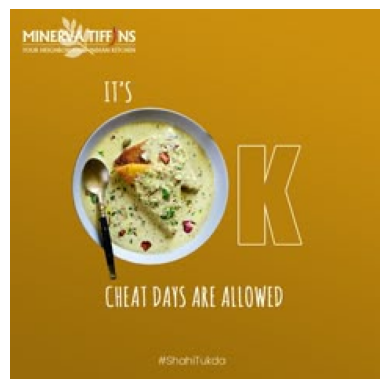

Food : 100.00
Meal : 100.00
Dish : 99.89
Advertisement : 99.15
Poster : 99.15
Bowl : 98.43
Cutlery : 98.15
Spoon : 98.15
Soup Bowl : 88.94
Processing: https://i.pinimg.com/736x/56/d9/53/56d95390b09e676191e43e6494c8dcc5.jpg


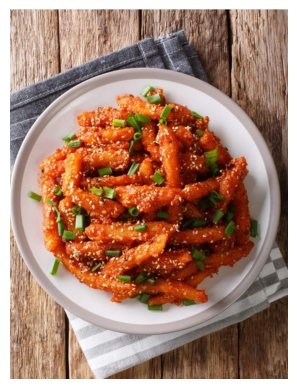

Food : 100.00
Food Presentation : 100.00
Seasoning : 99.77
Sesame : 99.77
Processing: https://i.pinimg.com/736x/5b/78/f4/5b78f4733ba07325f60348d48cce3101.jpg


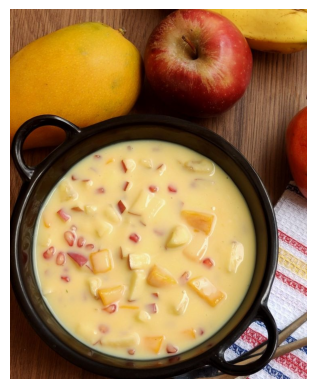

Food : 99.95
Meal : 99.95
Cooking Pot : 99.85
Cookware : 99.85
Pot : 99.85
Dish : 99.68
Apple : 99.40
Fruit : 99.40
Plant : 99.40
Produce : 99.40
Bowl : 98.30
Banana : 97.46
Custard : 96.79
Food Presentation : 92.29
Cooking Pan : 75.82
Pear : 75.79
Processing: https://i.pinimg.com/736x/ea/14/3f/ea143fa0c5570aaff758adc2018b366c.jpg


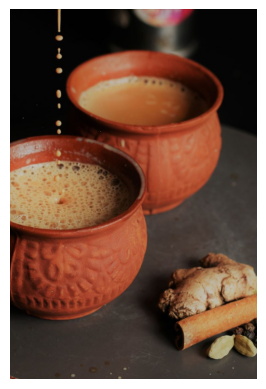

Food : 95.12
Beverage : 89.26
Coffee : 89.26
Coffee Cup : 89.26
Spice : 84.87
Cardamom : 80.19
Food Presentation : 75.56
Dynamite : 71.72
Weapon : 71.72
Processing: https://i.pinimg.com/736x/0a/4c/c0/0a4cc0a7e5acfac67a80976420d78184.jpg


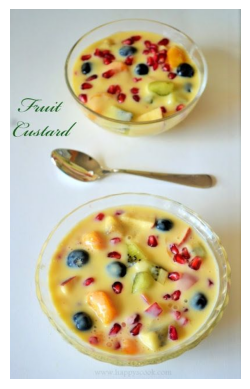

Custard : 99.98
Food : 99.98
Cutlery : 99.05
Spoon : 99.05
Berry : 88.41
Fruit : 88.41
Plant : 88.41
Produce : 88.41
Blueberry : 79.55
Dessert : 74.71
Processing: https://i.pinimg.com/736x/39/40/47/39404795702b3e57be68dd57f9dfa608.jpg


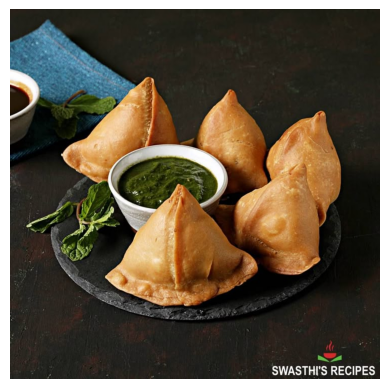

Food : 99.96
Food Presentation : 99.96
Plate : 90.18
Beverage : 73.73
Coffee : 73.73
Coffee Cup : 73.73
Processing: https://i.pinimg.com/736x/99/1d/95/991d957ec4f88dbe57d251fc2a8bc035.jpg


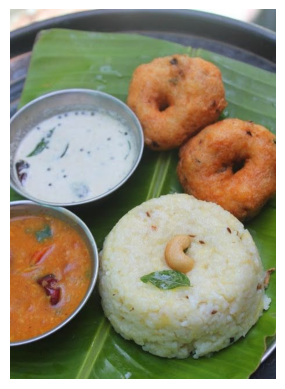

Food : 100.00
Food Presentation : 100.00
Bread : 91.83
Plate : 75.62
Processing: https://i.pinimg.com/736x/82/33/24/823324abff0fd051ca5421dc3ab879fa.jpg


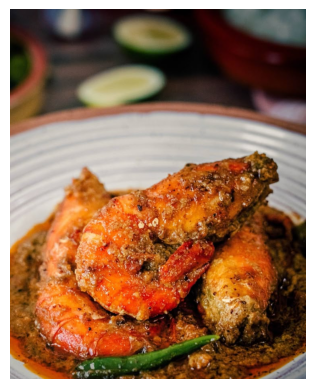

Food : 99.79
Food Presentation : 99.79
Meat : 96.16
Pork : 96.16
Mutton : 95.53
Seafood : 71.57
Processing: https://i.pinimg.com/736x/0c/51/f7/0c51f77ab42bebbe1fabba3304f5fe4e.jpg


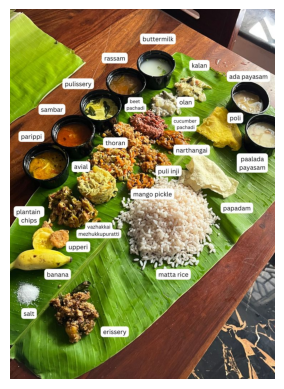

Food : 99.99
Lunch : 99.99
Meal : 99.99
Food Presentation : 99.90
Plate : 89.99
Processing: https://i.pinimg.com/736x/53/a5/c1/53a5c1d591035137f6609ad254ba0098.jpg


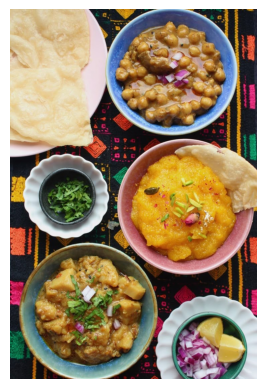

Food : 100.00
Food Presentation : 100.00
Plate : 96.76
Processing: https://i.pinimg.com/736x/5d/bd/9a/5dbd9a2f5a44fe6a6edd933e2ccd4ed4.jpg


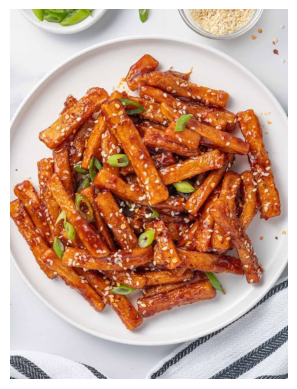

Food : 100.00
Food Presentation : 100.00
Meat : 99.04
Pork : 99.04
Seasoning : 95.16
Sesame : 95.16
Plate : 92.54
Processing: https://i.pinimg.com/736x/75/5e/2b/755e2bd30baf598759830a5c46eccd30.jpg


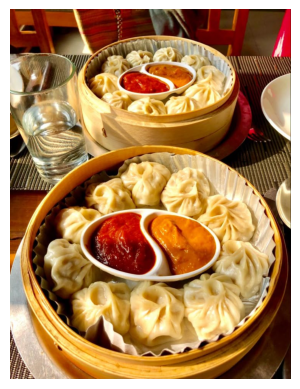

Food : 99.99
Food Presentation : 99.99
Meal : 99.01
Ketchup : 97.32
Dish : 91.82
Plate : 81.45
Cutlery : 72.28
Fork : 72.28
Processing: https://i.pinimg.com/736x/a7/d7/c0/a7d7c03c197f73d647693838d13aa7ed.jpg


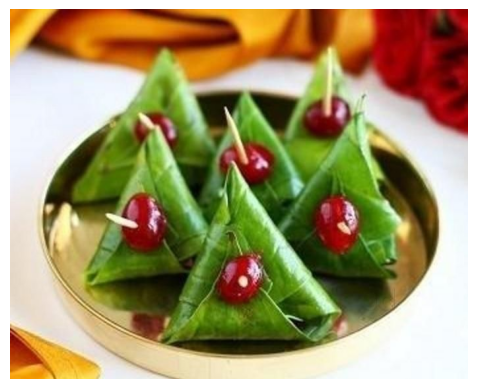

Food : 100.00
Food Presentation : 100.00
Plate : 97.06
Fruit : 82.54
Plant : 82.54
Produce : 82.54
Leaf : 82.50
Person : 70.19
Processing: https://i.pinimg.com/736x/22/02/ba/2202babec7326d4833cd60d63bb502a7.jpg


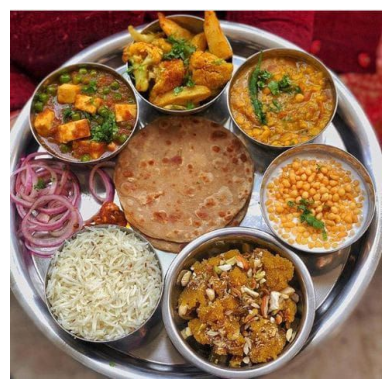

Food : 100.00
Food Presentation : 100.00
Dinner : 98.96
Bread : 95.99
Plate : 92.92
Meat : 73.57
Mutton : 73.57
Processing: https://i.pinimg.com/736x/41/61/57/416157a7068493fe859a9b4314320575.jpg


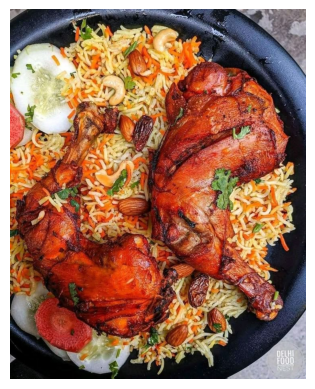

Food : 100.00
Food Presentation : 100.00
Meat : 99.59
Pork : 99.59
Mutton : 94.24
Processing: https://i.pinimg.com/736x/8c/d8/ed/8cd8ed31444bc7c71dacdf3658ad0eb1.jpg


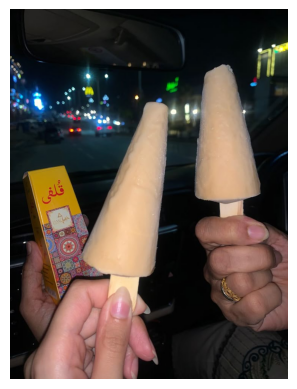

Cream : 98.63
Dessert : 98.63
Food : 98.63
Ice Cream : 98.63
Frozen Yogurt : 94.04
Ice Pop : 85.55
Processing: https://i.pinimg.com/736x/00/af/71/00af715760573bc336ea694ace67e98d.jpg


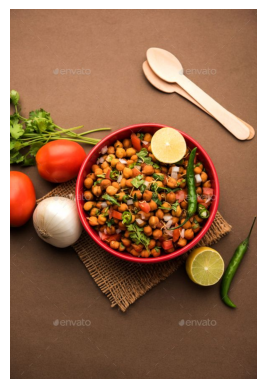

Cutlery : 99.09
Spoon : 99.09
Food : 91.60
Produce : 91.60
Meal : 88.12
Lunch : 79.24
Bean : 76.50
Plant : 76.50
Vegetable : 76.50
Processing: https://i.pinimg.com/736x/e3/3c/f8/e33cf82442e25cffcaabc0d2a2f5817d.jpg


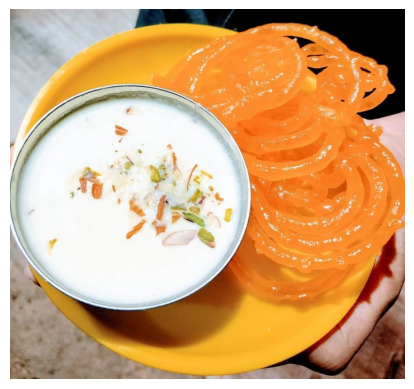

Food : 100.00
Food Presentation : 100.00
Meal : 92.27
Plate : 91.92
Bowl : 87.69
Dish : 70.87
Processing: https://i.pinimg.com/736x/f9/53/74/f953748e4f7902878557195df301a227.jpg


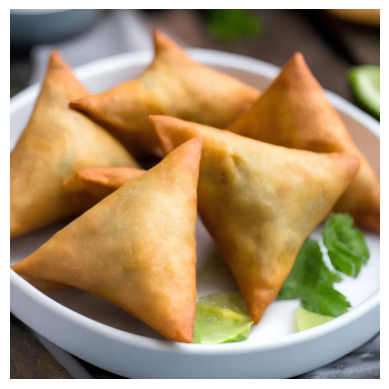

Food : 99.99
Food Presentation : 99.99
Dessert : 98.34
Pastry : 98.34
Fruit : 95.27
Pear : 95.27
Plant : 95.27
Produce : 95.27
Bread : 77.76
Processing: https://i.pinimg.com/736x/6f/67/17/6f6717b434fcc97cb5fc8747b23b5001.jpg


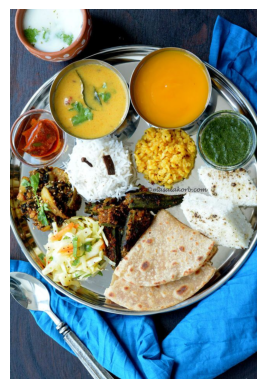

Food : 100.00
Food Presentation : 100.00
Brunch : 92.98
Dinner : 84.43
Processing: https://i.pinimg.com/736x/51/c0/aa/51c0aafdfde4dfebb6a647b349635a12.jpg


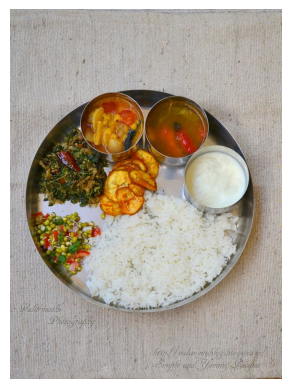

Food : 100.00
Food Presentation : 100.00
Lunch : 100.00
Meal : 100.00
Plate : 97.10
Dinner : 95.10
Processing: https://i.pinimg.com/736x/0f/1f/ee/0f1fee44005e5fee8c38930daa919b22.jpg


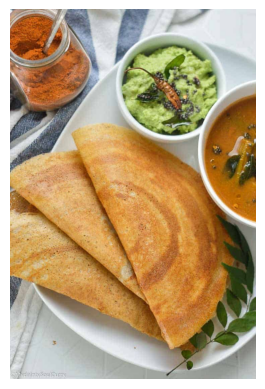

Bread : 99.03
Food : 99.03
Pancake : 87.44
Food Presentation : 82.13
Processing: https://i.pinimg.com/736x/cf/ba/96/cfba96c060ba3d90ce4d9dce62e87acd.jpg


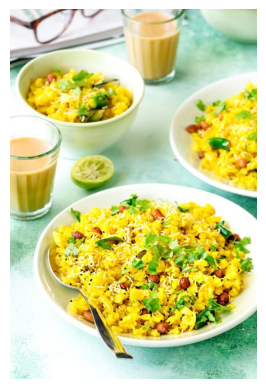

Food : 100.00
Food Presentation : 100.00
Plate : 94.95
Cup : 75.71
Processing: https://i.pinimg.com/736x/5e/80/53/5e805329e99d9d9ef3d34c193e93dcc6.jpg


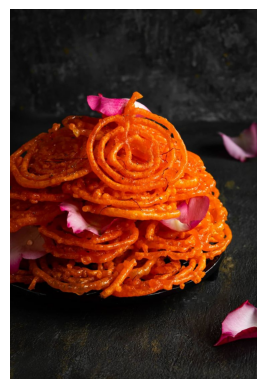

Food : 100.00
Food Presentation : 100.00
Burger : 97.37
Processing: https://i.pinimg.com/75x75_RS/65/83/e8/6583e895d9a1310e14403cd483f9b199.jpg


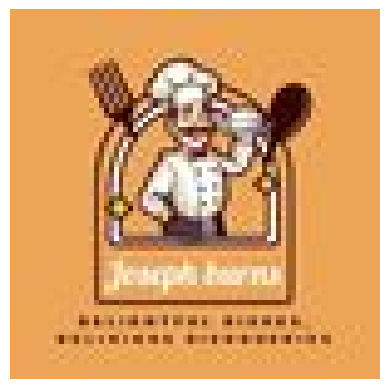

Advertisement : 100.00
Poster : 100.00
Logo : 94.00
Smoke Pipe : 73.63
Processing: https://i.pinimg.com/75x75_RS/08/9e/16/089e16a72cd45cacf198b90b73a4eb62.jpg


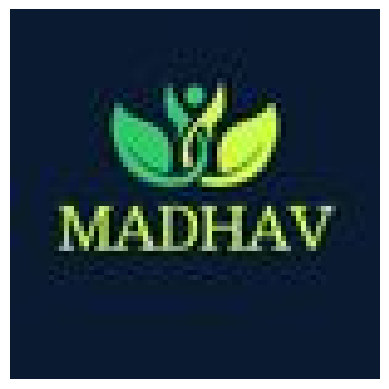

Logo : 100.00
Green : 94.99
Dynamite : 81.42
Weapon : 81.42
Processing: https://i.pinimg.com/75x75_RS/10/b1/7b/10b17b165b07824efba0fd08c90d1a95.jpg


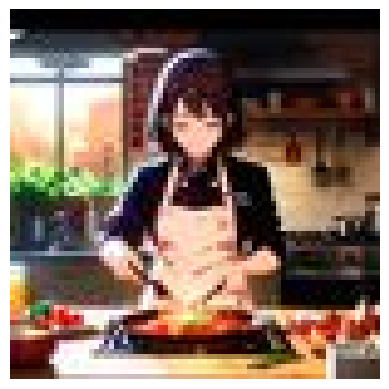

Clothing : 99.82
Hood : 99.82
Chef : 93.98
Person : 93.98
Adult : 90.11
Female : 90.11
Woman : 90.11
Processing: https://i.pinimg.com/75x75_RS/8e/61/fe/8e61fec038c12860c31bdd2c8da7faa4.jpg


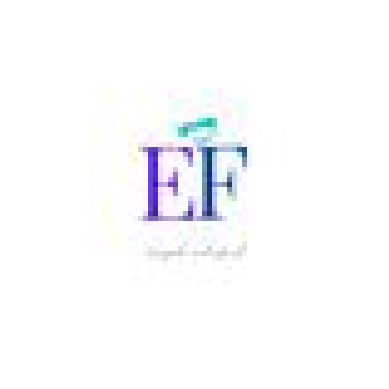

Logo : 100.00
Text : 71.57
Processing: https://i.pinimg.com/736x/e9/cd/f5/e9cdf59013a652f8cf257f6cd5eca112.jpg


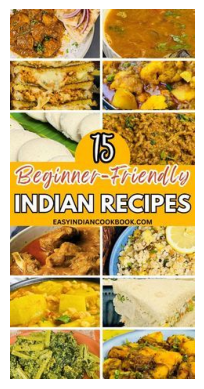

Food : 100.00
Lunch : 100.00
Meal : 100.00
Dinner : 99.58
Curry : 99.24
Cafeteria : 80.19
Indoors : 80.19
Restaurant : 80.19
Dish : 77.36
Stuffing : 77.07
Processing: https://i.pinimg.com/236x/5a/f2/8a/5af28a6de64d2db9710440874eca797d.jpg


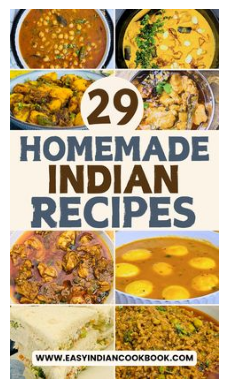

Curry : 100.00
Food : 100.00
Lunch : 100.00
Meal : 100.00
Dish : 98.66
Dinner : 78.69
Processing: nan
Error processing nan: expected str, bytes or os.PathLike object, not float
Processing: https://i.pinimg.com/75x75_RS/78/db/88/78db886320036254a0d54f742c469ebc.jpg


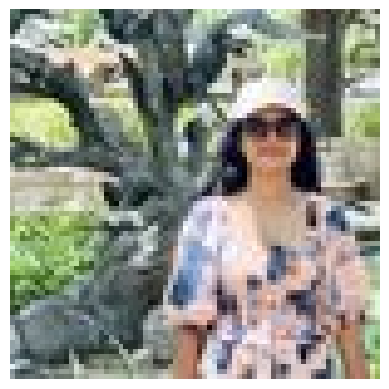

Clothing : 100.00
Hat : 100.00
Rock : 99.75
Adult : 99.64
Female : 99.64
Person : 99.64
Woman : 99.64
Sun Hat : 99.46
Lady : 92.62
Done analyzing all images.


In [14]:
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import os
import boto3
import urllib.request as urllib2

# AWS Rekognition client
rekognition = boto3.client('rekognition')

# Output dictionary
output = {"filenames": [], "labels": [], "confidencescores": []}

# Load image URLs from CSV
inputdata = pd.read_csv("TIF_Results.csv", header=0)
imageurllist = list(inputdata["img_url"])

# Loop through image URLs
for imageurl in imageurllist:
    try:
        print(f"Processing: {imageurl}")
        image_name = os.path.basename(imageurl)

        # Display image (optional)
        response = requests.get(imageurl)
        image = Image.open(BytesIO(response.content))
        plt.imshow(image)
        plt.axis('off')
        plt.show()

        # Download image bytes for Rekognition
        contents = urllib2.urlopen(imageurl).read()
        rekog_response = rekognition.detect_labels(Image={'Bytes': contents})

        labels_list = []
        confidencescores_list = []

        # Filter high-confidence labels
        for label in rekog_response['Labels']:
            if label['Confidence'] > 70.00:
                print(f"{label['Name']} : {label['Confidence']:.2f}")
                labels_list.append(label['Name'])
                confidencescores_list.append(label['Confidence'])

        # Save results — even if no high-confidence label is found
        if not labels_list:
            output["filenames"].append(image_name)
            output["labels"].append(["No labels found"])
            output["confidencescores"].append(["0"])
        else:
            output["filenames"].append(image_name)
            output["labels"].append(labels_list)
            output["confidencescores"].append(confidencescores_list)

    except Exception as e:
        print(f"Error processing {imageurl}: {e}")

# Save to CSV
results_df = pd.DataFrame.from_dict(output)
results_df.to_csv("TIF_RekognitionResults.csv", index=False)

print("Done analyzing all images.")